# Satellite Image Data Analysis using numpy

Read more about WIFIRE at https://wifire.ucsd.edu

## Loading the libraries we need: numpy, scipy, matplotlib

In [13]:
%matplotlib inline
import numpy as np
from scipy import misc
import imageio
import matplotlib.pyplot as plt

## Creating a numpy array from an image file

In [15]:
from skimage import data
photo_data = np.asarray(imageio.imread('./sd-3layers.jpg'))
type(photo_data)

numpy.ndarray

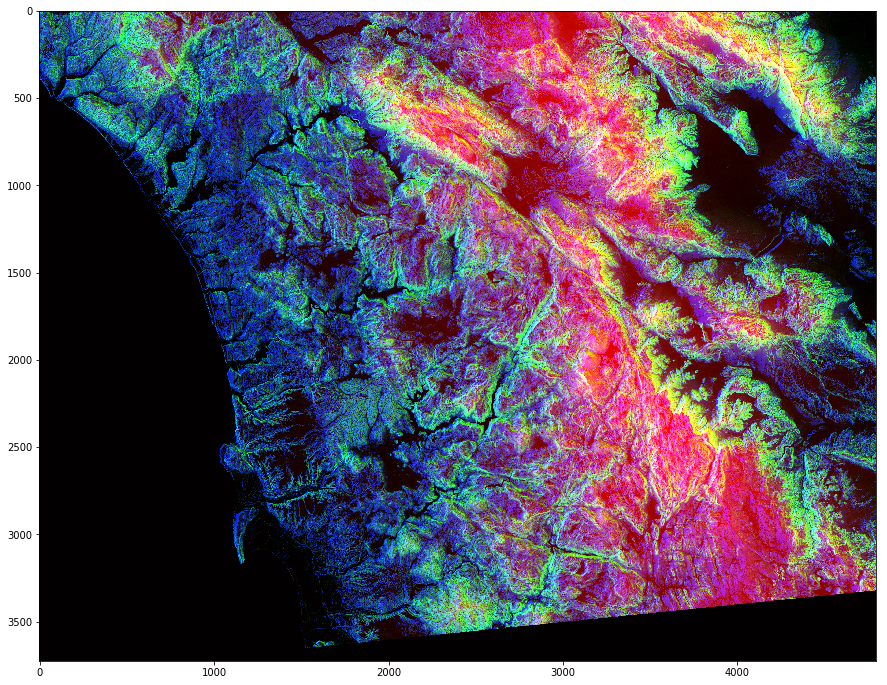

In [16]:
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

In [17]:
photo_data.shape

(3725, 4797, 3)

The shape of the ndarray show that it is a three layered matrix. The first two numbers here are length and width, and the third number is fore three layers: Red, Green, Blue
    
## RGB Color Mapping in the Photo:

+ RED pixel indicates Altitude
+ BLUE pixel indicate Aspect
+ GREEN pixel indicates Slope

The higher values denote higher altitude, aspect and slope

In [19]:
photo_data.size

53606475

In [20]:
photo_data.min(), photo_data.max()

(0, 255)

In [21]:
photo_data.mean()

75.77772429543259

## Pixel on the 150th Row and 250th Column

In [22]:
photo_data[150, 250]

array([ 15,  42, 233], dtype=uint8)

In [24]:
photo_data[150, 250, 1]

42

## Set a Pixel to All Zeros
We can set all three layer in a pixel as once by assigning zero globally to that (row, column) pairing. 
However, setting one pixel to zero is not noticeable

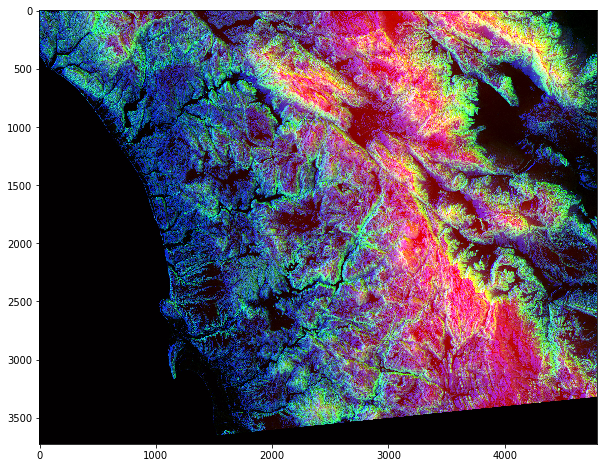

In [25]:
photo_data[150, 250] = 0
plt.figure(figsize=(10, 10))
plt.imshow(photo_data)

## Changing colors in a Range
Let's set the Green layer for rows 200 to 800 to full intensity.

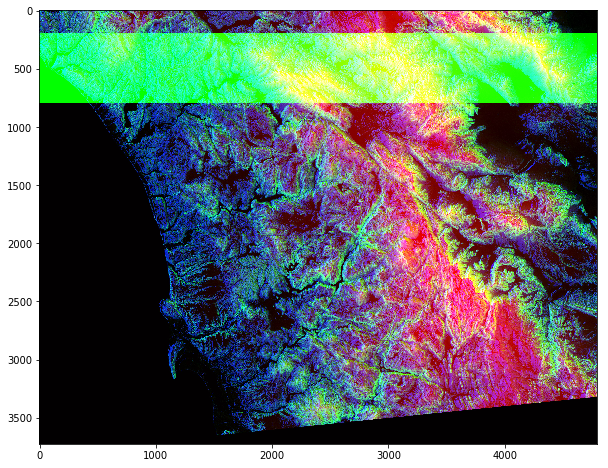

In [27]:
photo_data = imageio.imread('./sd-3layers.jpg')

photo_data[200:800, :, 1] = 255
plt.figure(figsize=(10, 10))
plt.imshow(photo_data)

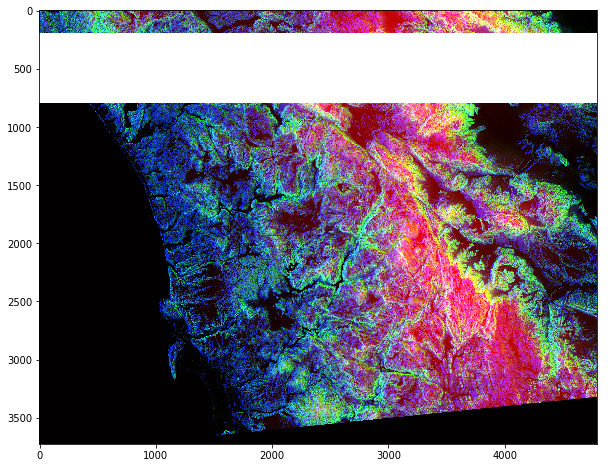

In [28]:
photo_data = imageio.imread('./sd-3layers.jpg')

photo_data[200:800, :] = 255
plt.figure(figsize=(10, 10))
plt.imshow(photo_data)

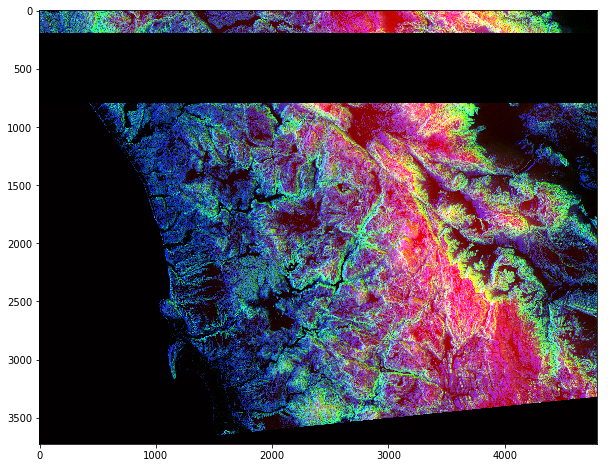

In [29]:
photo_data = imageio.imread('./sd-3layers.jpg')

photo_data[200:800, :] = 0
plt.figure(figsize=(10, 10))
plt.imshow(photo_data)

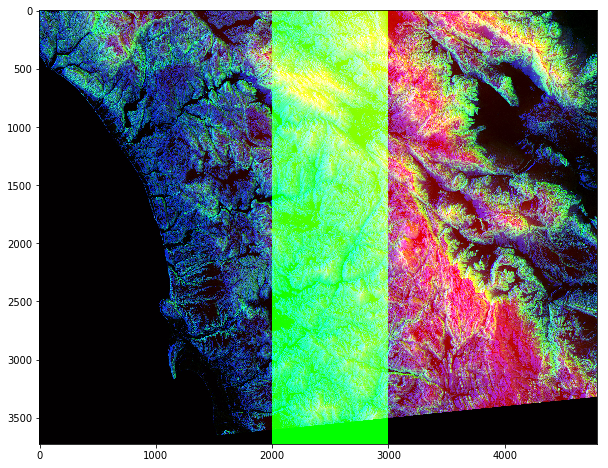

In [30]:
photo_data = imageio.imread('./sd-3layers.jpg')

photo_data[:, 2000:3000, 1] = 255
plt.figure(figsize=(10, 10))
plt.imshow(photo_data)

## Pick all Pixels with Low Values

In [33]:
photo_data = imageio.imread('./sd-3layers.jpg')

print('Shape of photo_data:', photo_data.shape)
low_value_filter = photo_data < 200 # 50 for low values
print('Shape of low_value_filter:', low_value_filter.shape)

Shape of photo_data: (3725, 4797, 3)
Shape of low_value_filter: (3725, 4797, 3)


## Filtering Out Low Values

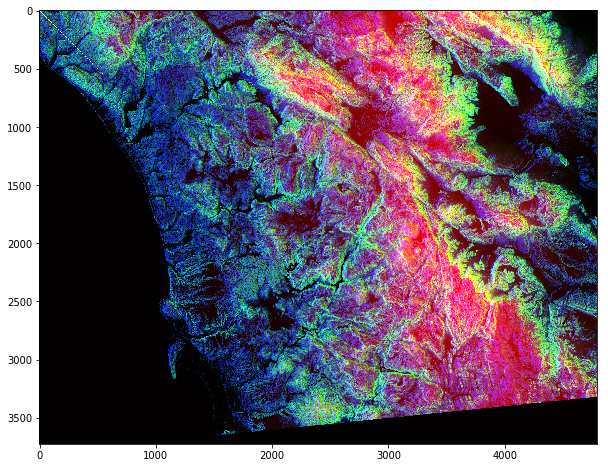

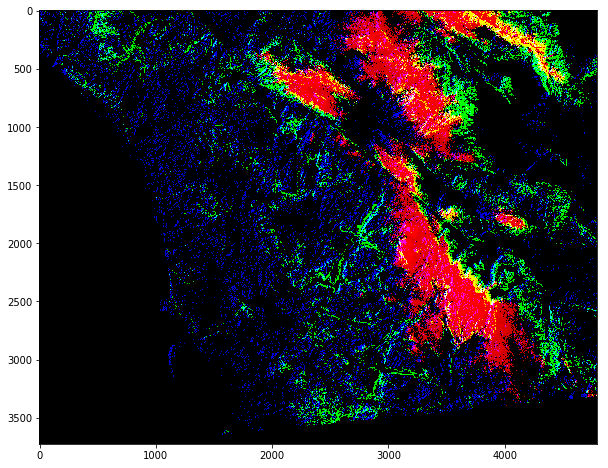

In [42]:
import random

plt.figure(figsize=(10,10))
plt.imshow(photo_data)

photo_data[low_value_filter] = 0
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

## More Row and Column Operations

In [47]:
# photo_data = imageio.imread('./sd-3layers.jpg')

rows_range = np.arange(len(photo_data))
cols_range = rows_range
print(type(rows_range))
print(rows_range.shape, cols_range.shape)

<class 'numpy.ndarray'>
(3725,) (3725,)


In [44]:
photo_data[rows_range, cols_range] = 255

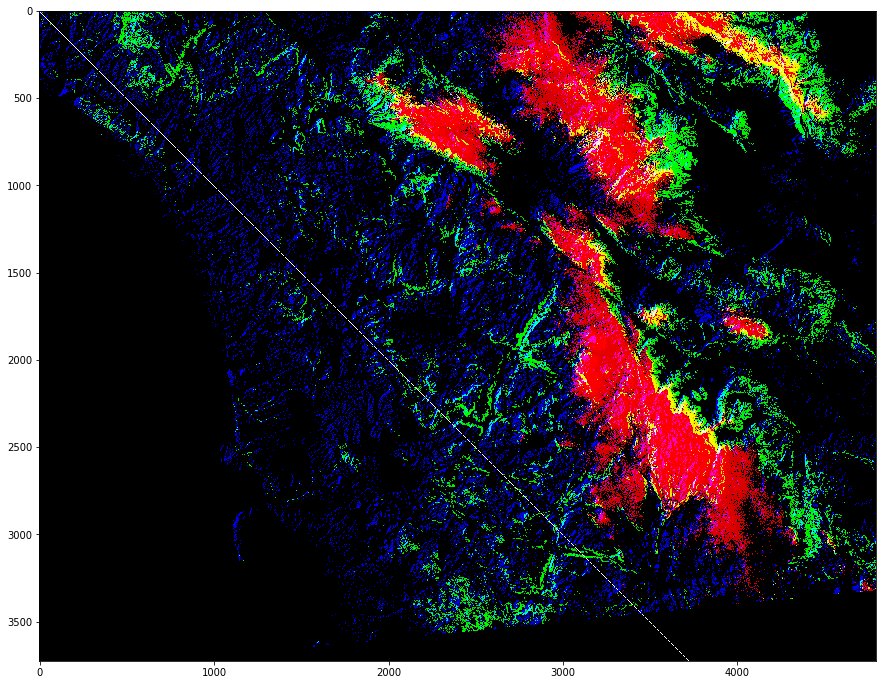

In [48]:
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

## Masking Images

In [50]:
total_rows, total_cols, total_layers = photo_data.shape

X, Y = np.ogrid[:total_rows, :total_cols]
print("X=", X.shape, 'Y=', Y.shape)

X= (3725, 1) Y= (1, 4797)


In [56]:
center_row, center_col = total_rows / 2, total_cols / 2
print('center_row=', center_row, 'center_col=', center_col)
# print(X - center_row)
# print(Y - center_col)
dist_from_center = (X - center_row)**2 + (Y - center_col)**2
# print(dist_from_center)
radius = (total_rows / 2)**2
print('Radius=', radius)
circular_mask = (dist_from_center > radius)
# print(circular_mask)
#print(circular_mask[1500:1700, 2000:2200])

center_row= 1862.5 center_col= 2398.5
Radius= 3468906.25


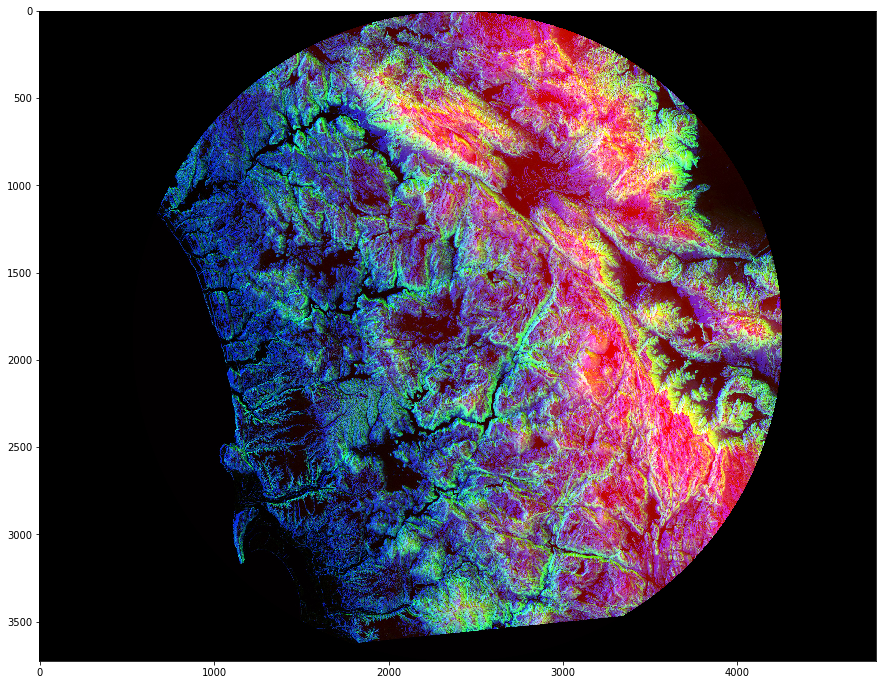

In [54]:
photo_data = imageio.imread('./sd-3layers.jpg')
photo_data[circular_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

## Further Masking

Get upper half disc

In [57]:
X, Y = np.ogrid[:total_rows, :total_cols]
half_upper = X < center_row

half_upper_mask = np.logical_and(half_upper, circular_mask)

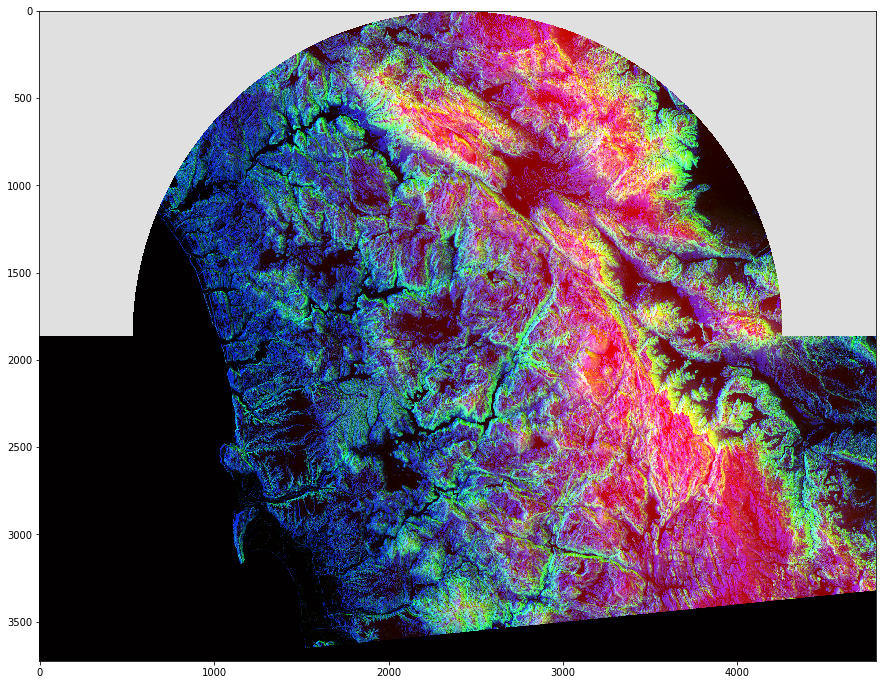

In [60]:
photo_data = imageio.imread('./sd-3layers.jpg')
photo_data[half_upper_mask] = 255
photo_data[half_upper_mask] = random.randint(200,255)
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

# Further Processing of our Satellite Imagery
## Processing of RED Pixels
Remember that red pixels tell us about the height. Let us try to highlight all the high altitude areas.
We will do this by detecting high intensity RED Pixels and muting down other areas

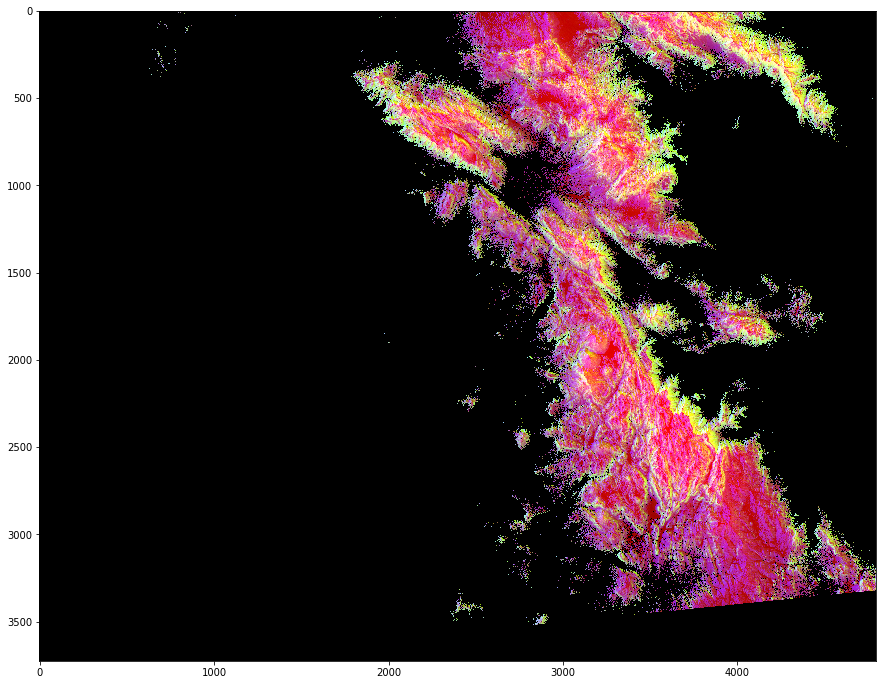

In [63]:
photo_data = imageio.imread('./sd-3layers.jpg')
red_mask = photo_data[:,:,0] < 150

photo_data[red_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

## Detecting High-GREEN Pixels

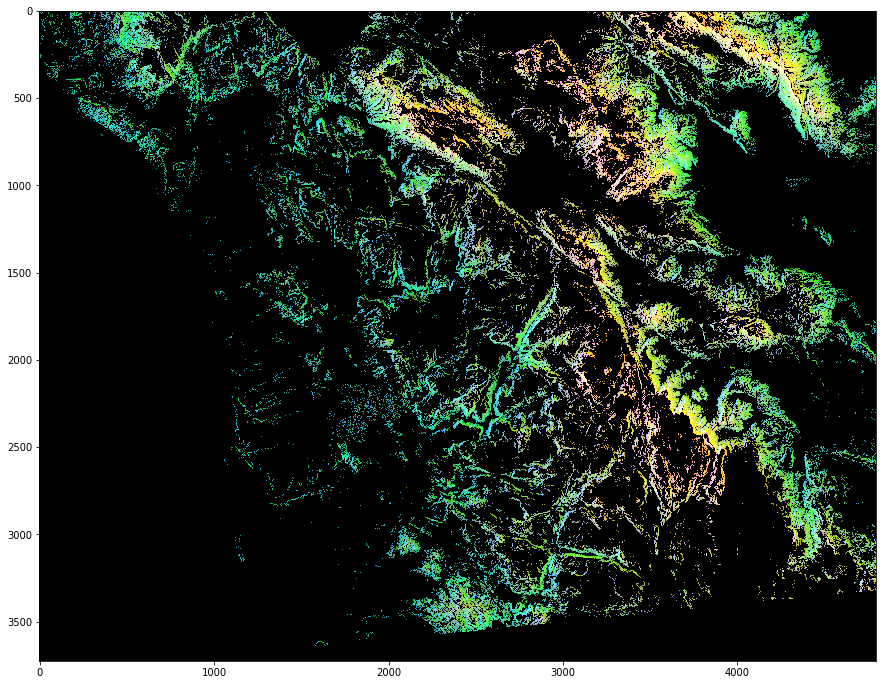

In [64]:
photo_data = imageio.imread('./sd-3layers.jpg')
green_mask = photo_data[:,:,1] < 150

photo_data[green_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

## Detecting High-BLUE Pixels

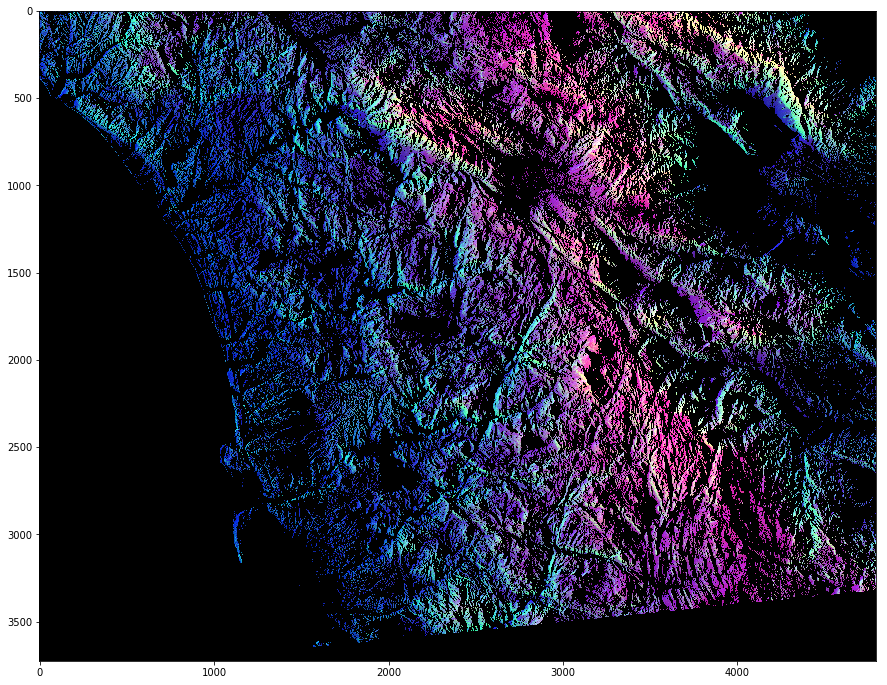

In [65]:
photo_data = imageio.imread('./sd-3layers.jpg')
blue_mask = photo_data[:,:,2] < 150

photo_data[blue_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

## Composite mask that takes thresholds on all three layers: RED, GREEN, BLUE

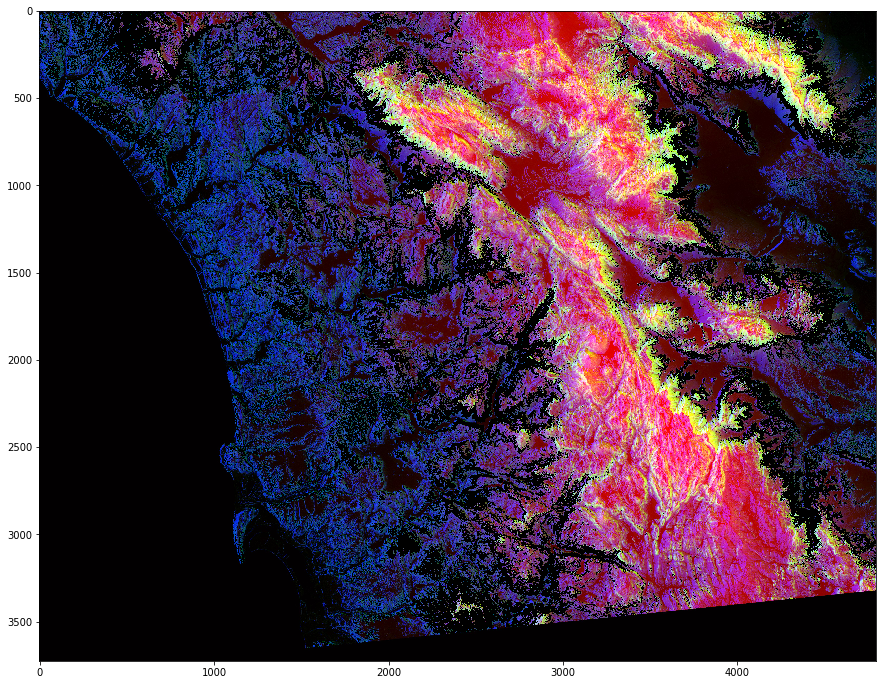

In [66]:
photo_data = imageio.imread('./sd-3layers.jpg')

red_mask = photo_data[:,:,0] < 150
green_mask = photo_data[:,:,1] > 100
blue_mask = photo_data[:,:,2] < 100

final_mask = np.logical_and(red_mask, green_mask, blue_mask)
photo_data[final_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)